In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

#%matplotlib inline

In [2]:
df = pd.read_csv('../data/processed/bank_churners_question_10_processed.csv')
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,...,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
0,1,45,1,3,1.0,2.0,0.0,39,5,1,...,777,11914.0,1.335,1144,42,1.625,0.061,True,False,False
1,1,49,0,5,3.0,0.0,0.0,44,6,1,...,864,7392.0,1.541,1291,33,3.714,0.105,False,True,False
2,1,51,1,3,3.0,3.0,0.0,36,4,1,...,0,3418.0,2.594,1887,20,2.333,0.000,True,False,False
3,1,40,0,4,1.0,0.0,0.0,34,3,4,...,2517,796.0,1.405,1171,20,2.333,0.760,False,False,True
4,1,40,1,3,0.0,2.0,0.0,21,5,1,...,0,4716.0,2.175,816,28,2.500,0.000,True,False,False


In [3]:
# Drop irrelevant columns
df = df.drop(["CLIENTNUM", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1", 
              "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
             ], axis=1)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


### EDA

In [4]:
credit_card_report = ProfileReport(df)
credit_card_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

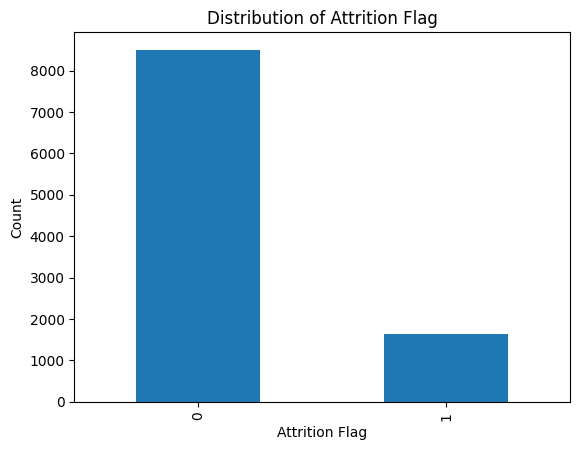

In [19]:
# Distribution of the target variable
df['Attrition_Flag'].value_counts().plot(kind='bar')
plt.xlabel('Attrition Flag')
plt.ylabel('Count')
plt.title('Distribution of Attrition Flag')
plt.show()

Imbalanced dataset may result in a biased model which is better at predicting for the majority class. Since this dataset is imbalanced, we have tried a few approaches: 
1. Class weights
2. SMOTE

### Data Preprocessing

In [4]:
# Check missing values
df.isna().sum()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

- From the output above and ProfileReport above, there is no NA value. Hence, we do not need to handle missing values. 
- It may be necessary to inspect the 0 values as well, since it maybe used as placeholder for NA value. 
Here are 4 columns with 0 values: Contacts_Count_12_mon (3.9%), Dependent Count (8.9%), Total_Revolving_Balance (24.4%), Avg_Utilization_Ratio (24.4%). Based on domain knowledge, these zero values are reasonable. So we keep them. 
- However, for categorical values, around 11% of 'Income_Category' and 15% of 'Education_Level' are recorded as "Unknown". This proportion is not negligible, so we decided to keep them by imputing with mode. We will impute with mode after train-test split to avoid data leakage.

### Feature Engineering

In [4]:
# Encode categorical values
categorical_columns = df.select_dtypes(exclude=['int64','float64']).columns
categorical_columns

Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')

In [9]:
# Check the unique values of each categorical column
print(df['Attrition_Flag'].unique())
print(df['Gender'].unique())
print(df['Marital_Status'].unique())
print(df['Card_Category'].unique())
print(df['Education_Level'].unique())
print(df['Income_Category'].unique())

['Existing Customer' 'Attrited Customer']
['M' 'F']
['Married' 'Single' 'Unknown' 'Divorced']
['Blue' 'Gold' 'Silver' 'Platinum']
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']


In [5]:
# Encode binary features
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Attrited Customer':1, 'Existing Customer':0}) # Target variable
df['Gender'] = df['Gender'].map({'M':1, 'F':0})

# Encode non-ordinal feature
df = pd.get_dummies(df, columns=['Marital_Status'], drop_first=True) # One-hot encode Marital_Status

# Encode ordinal features
df['Card_Category'] = df['Card_Category'].map({'Blue':0, 'Silver':1, 'Gold':2, 'Platinum':3})
df['Education_Level'] = df['Education_Level'].map({'Uneducated':0, 'High School':1, 'College':2, 'Graduate':3, 'Post-Graduate':4, 'Doctorate':5})
df['Income_Category'] = df['Income_Category'].map({'Less than $40K':0, '$40K - $60K':1, '$60K - $80K':2, '$80K - $120K':3, '$120K +':4})

### Modelling

In [6]:
# Train-test split
from sklearn.model_selection import train_test_split

X = df.drop('Attrition_Flag', axis=1)
y = df['Attrition_Flag']

# Split the dataset into training and testing sets with stratified split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42) 

In [7]:
# Impute 'Unknown' values with the mode of the column
X_train.fillna({'Education_Level': X_train['Education_Level'].mode()[0]}, inplace=True)
X_train.fillna({'Income_Category': X_train['Income_Category'].mode()[0]}, inplace=True)

X_test.fillna({'Education_Level': X_test['Education_Level'].mode()[0]}, inplace=True)
X_test.fillna({'Income_Category': X_test['Income_Category'].mode()[0]}, inplace=True)

### Model training

For model implementation, we choose Logistic Regression as baseline, Random Forest for a balance between interpretability and performance, and XGBoost for performance. 

For model evaluation, we use a combination of threshold-dependent and threshold-independent metrics. Since the dataset is imbalanced, we choose the following metrics:
- F1 score, recall, precision
- Precision-Recall curve & Area Under Curve (PR-AUC)

In [8]:
from sklearn.metrics import classification_report, f1_score, precision_recall_curve, average_precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import shap

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.83      0.89      1701
           1       0.47      0.81      0.60       325

    accuracy                           0.82      2026
   macro avg       0.71      0.82      0.74      2026
weighted avg       0.88      0.82      0.84      2026



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


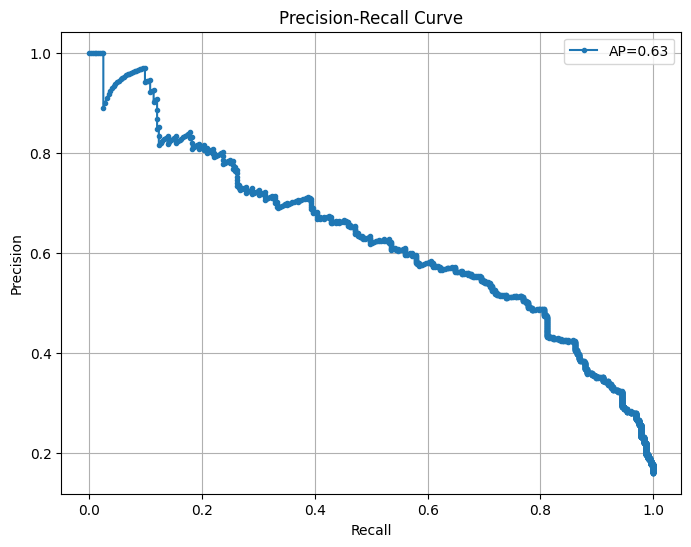

In [9]:
# Logistic Regression with class_weight='balanced'
lr_model = LogisticRegression(class_weight='balanced')
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_test)
y_prob = lr_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97      1701
           1       0.94      0.76      0.84       325

    accuracy                           0.95      2026
   macro avg       0.95      0.88      0.91      2026
weighted avg       0.95      0.95      0.95      2026



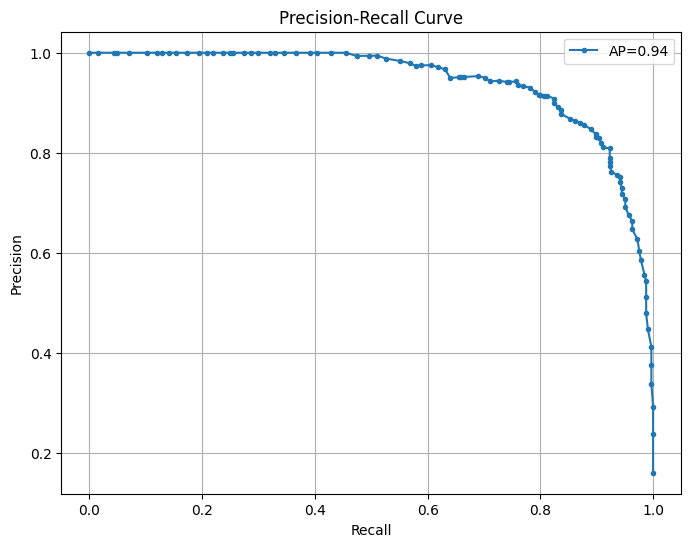

In [10]:
# Random Forest model with class_weight='balanced'
rv_model = RandomForestClassifier(class_weight='balanced')
rv_model.fit(X_train, y_train)

y_pred = rv_model.predict(X_test)
y_prob = rv_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1701
           1       0.91      0.89      0.90       325

    accuracy                           0.97      2026
   macro avg       0.95      0.94      0.94      2026
weighted avg       0.97      0.97      0.97      2026



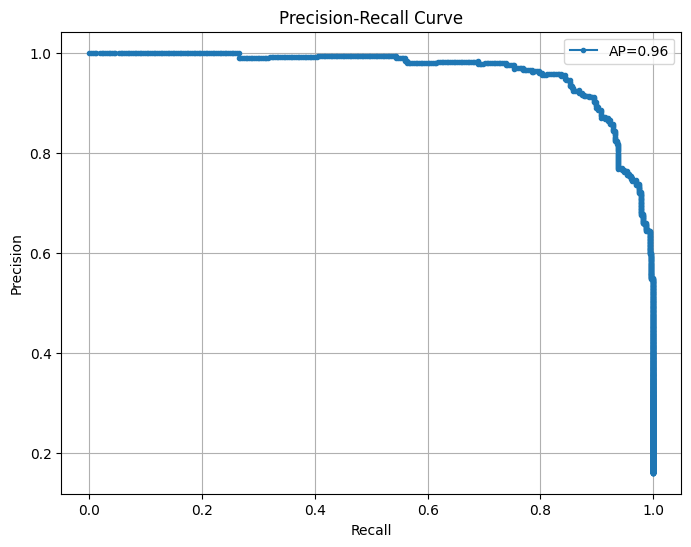

In [11]:
# XGBoost model with scale_pos_weight
xgb_model = XGBClassifier(scale_pos_weight=sum(y_train == 0) / sum(y_train == 1))
xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

Since XGBoost performs best among the three, we tried SMOTE for XGBoost, hoping to boost the model performance.

Ratio: 0.3, F1-score: 0.9117, PR-AUC: 0.9668
Ratio: 0.325, F1-score: 0.8952, PR-AUC: 0.9634
Ratio: 0.35000000000000003, F1-score: 0.8981, PR-AUC: 0.9641
Ratio: 0.37500000000000006, F1-score: 0.9036, PR-AUC: 0.9608
Ratio: 0.4000000000000001, F1-score: 0.9038, PR-AUC: 0.9646
Ratio: 0.4250000000000001, F1-score: 0.8984, PR-AUC: 0.9661
Ratio: 0.4500000000000001, F1-score: 0.8967, PR-AUC: 0.9633
Ratio: 0.47500000000000014, F1-score: 0.9057, PR-AUC: 0.9659
Ratio: 0.5000000000000002, F1-score: 0.8804, PR-AUC: 0.9650
Ratio: 0.5250000000000001, F1-score: 0.9042, PR-AUC: 0.9640
Ratio: 0.5500000000000003, F1-score: 0.8948, PR-AUC: 0.9628
Ratio: 0.5750000000000002, F1-score: 0.9082, PR-AUC: 0.9677
Ratio: 0.6000000000000003, F1-score: 0.8889, PR-AUC: 0.9674
Ratio: 0.6250000000000002, F1-score: 0.8970, PR-AUC: 0.9634
Ratio: 0.6500000000000004, F1-score: 0.9045, PR-AUC: 0.9662
Ratio: 0.6750000000000003, F1-score: 0.9059, PR-AUC: 0.9657
Ratio: 0.7000000000000004, F1-score: 0.9059, PR-AUC: 0.9663


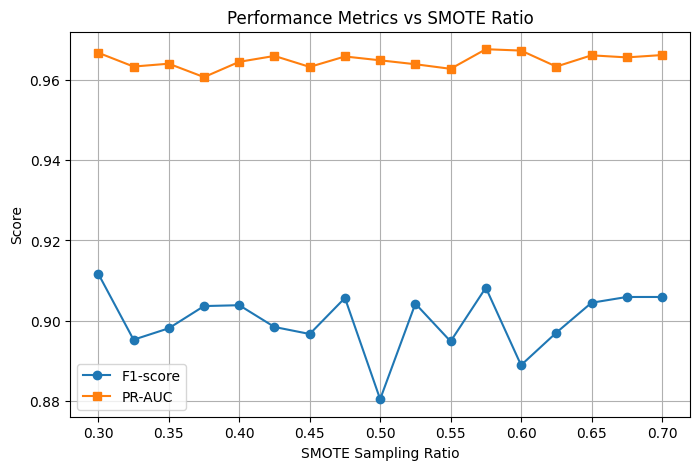

In [17]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE with different ratios
sampling_ratios = np.arange(0.3, 0.71, 0.025)

results = []

for ratio in sampling_ratios:
    # Apply SMOTE with the current ratio
    smote = SMOTE(sampling_strategy=ratio, random_state=42)
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

    # Train logistic regression model
    model = XGBClassifier()
    model.fit(X_resampled, y_resampled)

    # Make predictions on the test set
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # Calculate evaluation metrics
    f1 = f1_score(y_test, y_pred)
    avg_precision = average_precision_score(y_test, y_prob)

    results.append({'Ratio': ratio, 'F1-score': f1, 'PR-AUC': avg_precision})

    print(f"Ratio: {ratio}, F1-score: {f1:.4f}, PR-AUC: {avg_precision:.4f}")

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Plot the results
plt.figure(figsize=(8, 5))
plt.plot(results_df['Ratio'], results_df['F1-score'], marker='o', label='F1-score')
plt.plot(results_df['Ratio'], results_df['PR-AUC'], marker='s', label='PR-AUC')
plt.xlabel('SMOTE Sampling Ratio')
plt.ylabel('Score')
plt.title('Performance Metrics vs SMOTE Ratio')
plt.legend()
plt.grid(True)
plt.show()

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.92      0.86      0.89       325

    accuracy                           0.97      2026
   macro avg       0.95      0.92      0.93      2026
weighted avg       0.96      0.97      0.97      2026



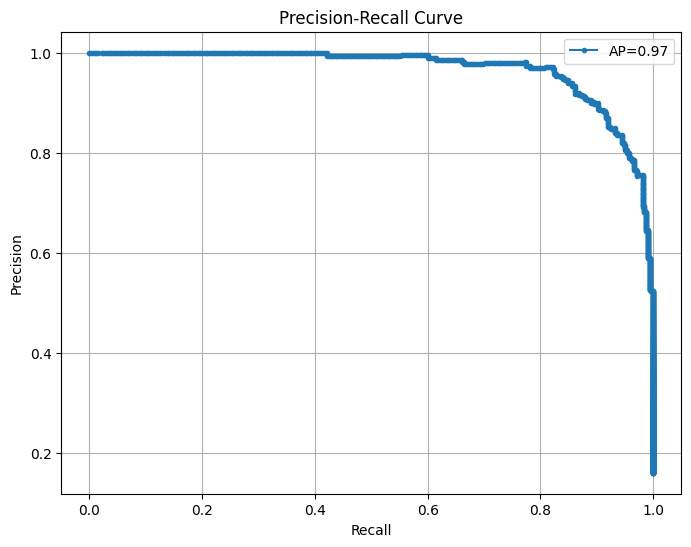

In [18]:
# Final XGBoost model with SMOTE
smote = SMOTE(sampling_strategy=0.6, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

xgb_model = XGBClassifier()
xgb_model.fit(X_resampled, y_resampled)

y_pred = xgb_model.predict(X_test)
y_prob = xgb_model.predict_proba(X_test)[:, 1]

# Model evaluation
print("Classification Report:")
print(classification_report(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_prob)
avg_precision = average_precision_score(y_test, y_prob)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, marker='.', label=f'AP={avg_precision:.2f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid()
plt.show()

### Model Interpretation

To interpret the model and draw business insights, we implemented both model-specific methods and model-agnostic methods.

##### Model-specific methods: feature importance for tree-based algorithms

Feature ranking:
1. feature Total_Trans_Ct (0.2817051112651825)
2. feature Total_Revolving_Bal (0.11403544992208481)
3. feature Total_Relationship_Count (0.10494831949472427)
4. feature Marital_Status_Married (0.07770031690597534)
5. feature Total_Trans_Amt (0.06230732426047325)
6. feature Months_Inactive_12_mon (0.0588153600692749)
7. feature Gender (0.04986178129911423)
8. feature Contacts_Count_12_mon (0.043545421212911606)
9. feature Total_Ct_Chng_Q4_Q1 (0.039207953959703445)
10. feature Customer_Age (0.026398733258247375)
11. feature Total_Amt_Chng_Q4_Q1 (0.025964636355638504)
12. feature Marital_Status_Single (0.02536931447684765)
13. feature Avg_Open_To_Buy (0.015500259585678577)
14. feature Dependent_count (0.01399680320173502)
15. feature Credit_Limit (0.013823483139276505)
16. feature Card_Category (0.01027625985443592)
17. feature Months_on_book (0.008342163637280464)
18. feature Income_Category (0.008244320750236511)
19. feature Education_Level (0.007217980455607176)
20. fe

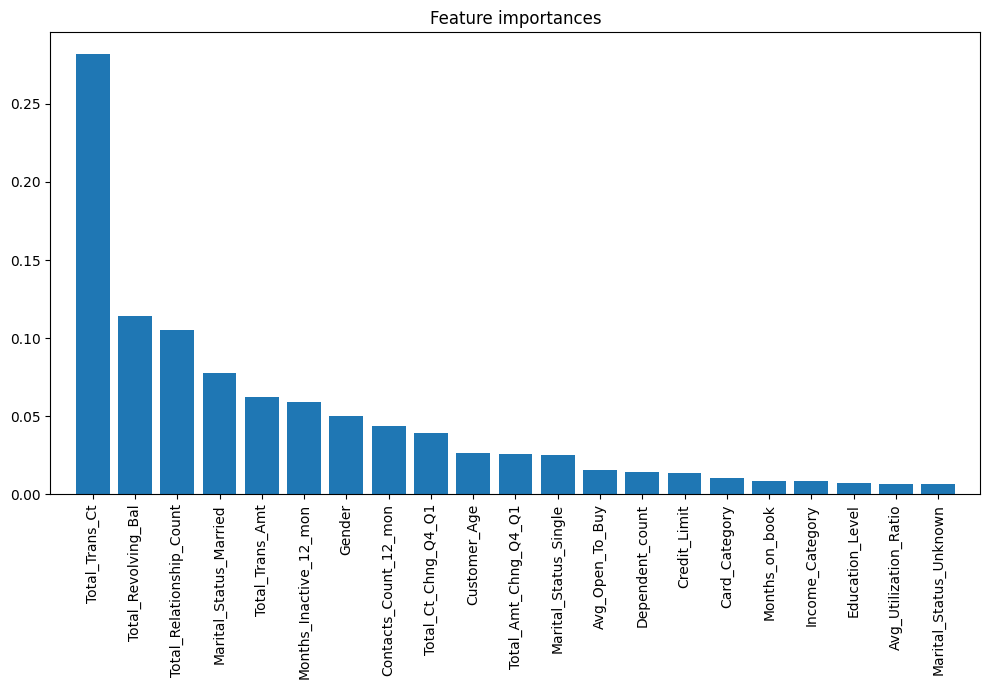

In [19]:
# Feature importance for XGBoost model
importances = xgb_model.feature_importances_
indices = np.argsort(importances)[::-1]

print("Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. feature {X.columns[indices[f]]} ({importances[indices[f]]})")

plt.figure(figsize=(12, 6))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

##### Model-agnostic methods: SHAP (SHapley Additive exPlanations)

In [13]:
# XGBoost explainer using SHAP
X_train = X_train.astype(float)  # Convert everything to float to avoid errors for SHAP
X_test = X_test.astype(float)

shap.initjs()
explainer = shap.Explainer(xgb_model, X_train)  # Tree-based SHAP explainer for XGBoost
shap_values = explainer(X_test)  # Compute SHAP values for test data
shap_values.shape

(2026, 21)

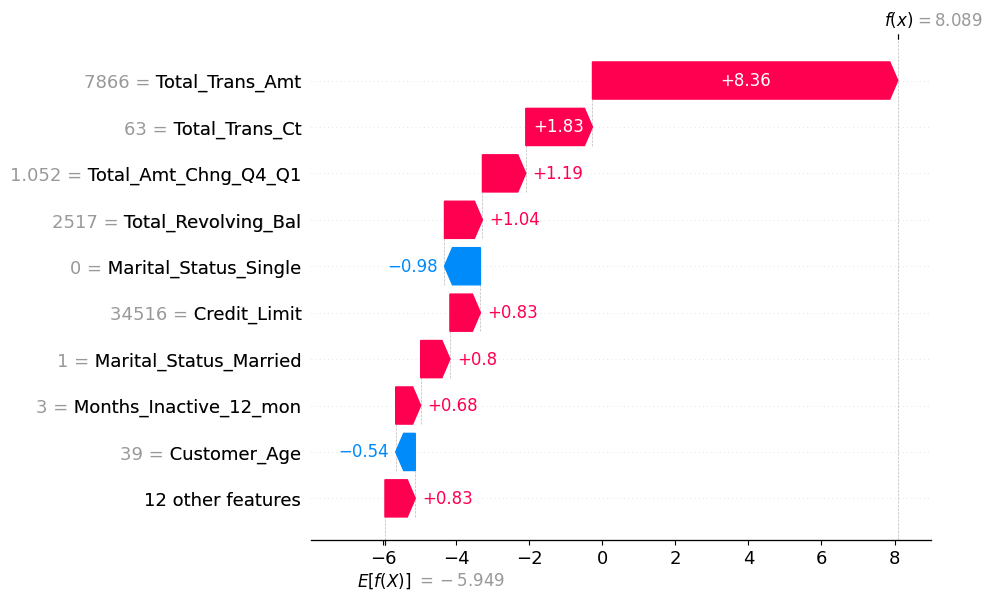

In [51]:
# Sample visualization of a positive class
churn_index = np.where(np.array(y_test) == 1)[0]  # Index of churned customers
shap.plots.waterfall(shap_values[churn_index[1]])

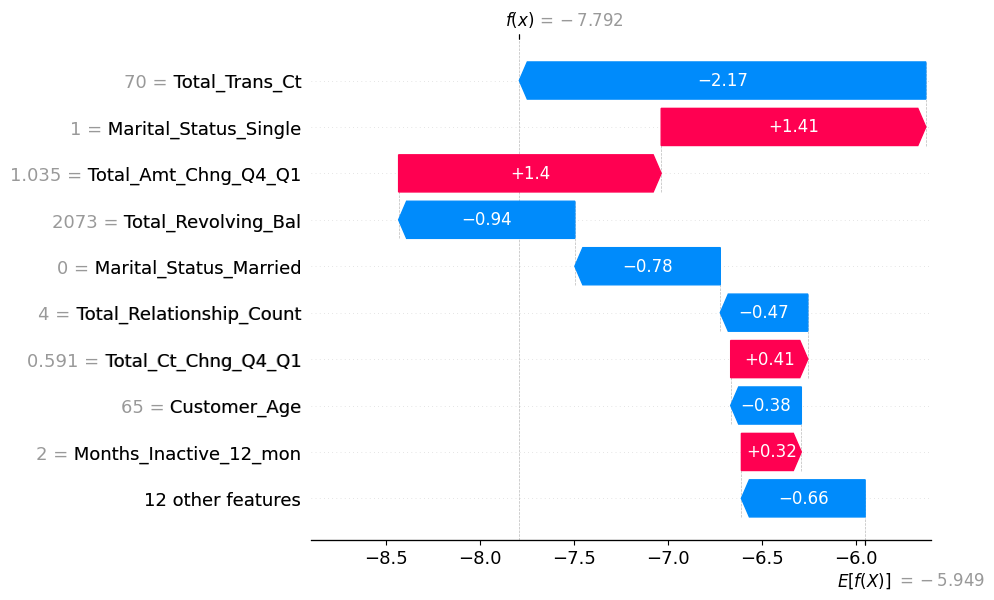

In [ ]:
# Sample visualization of a negative class 
shap.plots.waterfall(shap_values[0])

In [ ]:
# Visualize the same sample with a force plot
shap.plots.force(shap_values[0])

In [54]:
# Visualize all test set predictions
shap.plots.force(shap_values[:500])

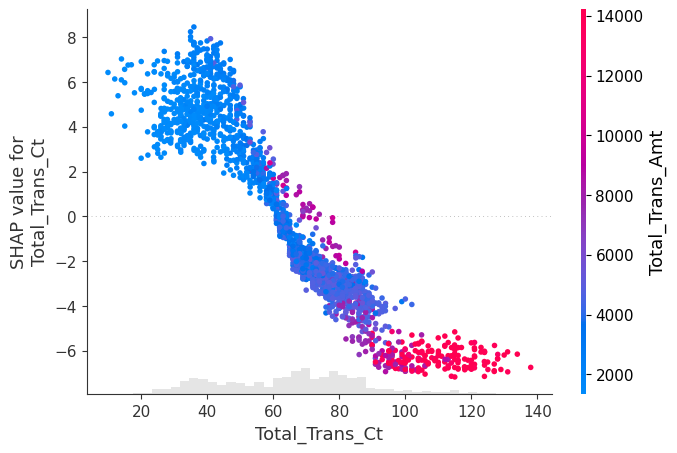

In [ ]:
# Dependence scatter plot to show the effect of a single feature across the whole dataset
shap.plots.scatter(shap_values[:, "Total_Trans_Ct"], color=shap_values)

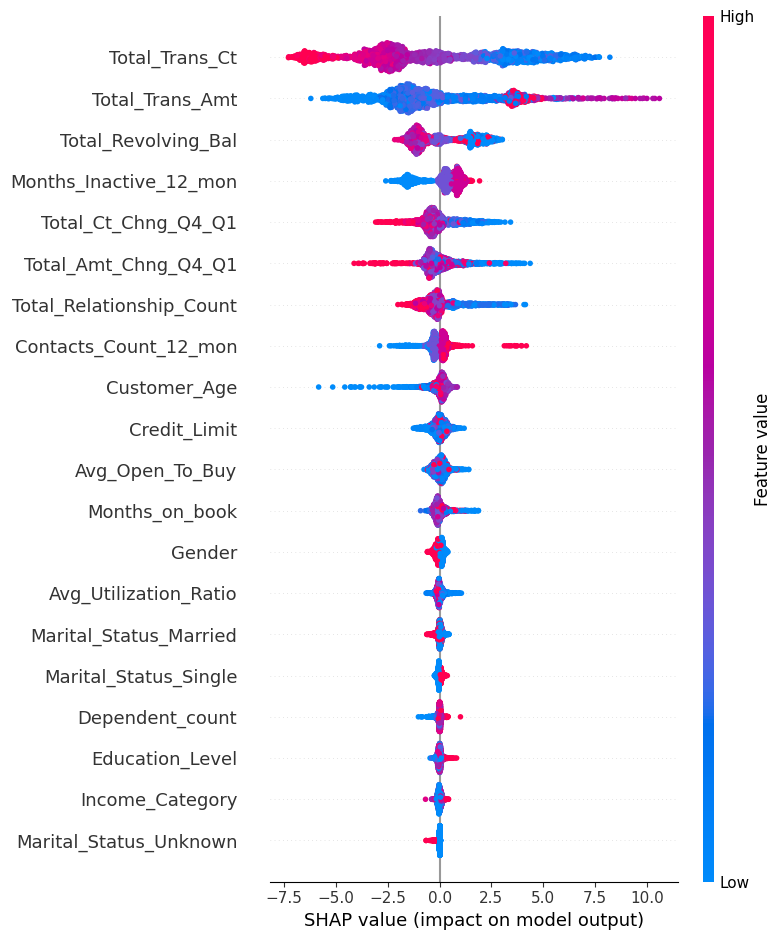

In [14]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_test)

##### Analysis of SHAP diagram
SHAP (SHapley Additive exPlanations) values represent the contribution of each feature to the model’s prediction.  
- A positive SHAP value indicates that the feature pushes the prediction toward churn.  
- A negative SHAP value indicates that the feature pushes the prediction toward retention.  
- The color shows feature value (red = high, blue = low).  

Feature: Total_Trans_Ct  
- Feature Explanation: Total number of transactions made by the customer in the last 12 months.  
- SHAP Interpretation: Low transaction counts strongly push the prediction toward churn, while high transaction counts push toward retention.  

Feature: Total_Trans_Amt  
- Feature Explanation: Total transaction amount in the last 12 months.  
- SHAP Interpretation: Lower amounts are associated with higher churn risk; higher amounts are associated with retention.  

Feature: Total_Revolving_Bal  
- Feature Explanation: Total revolving balance on the customer's credit card.  
- SHAP Interpretation: Medium to high revolving balances may push toward churn, while low balances have mixed impacts.  

Feature: Months_Inactive_12_mon  
- Feature Explanation: Number of months the customer has been inactive over the last 12 months.  
- SHAP Interpretation: Higher inactivity periods push the model prediction toward churn.  

Feature: Total_Ct_Chng_Q4_Q1  
- Feature Explanation: Change in transaction count from Q1 to Q4.  
- SHAP Interpretation: A decrease in transaction count correlates with churn, while stable or increasing counts indicate retention.  

Feature: Total_Amt_Chng_Q4_Q1  
- Feature Explanation: Change in transaction amount from Q1 to Q4.  
- SHAP Interpretation: A drop in transaction amount pushes toward churn; increases push toward retention.  

Feature: Total_Relationship_Count  
- Feature Explanation: Total number of products or accounts held by the customer.  
- SHAP Interpretation: Fewer products push toward churn; more products push toward retention.  

Feature: Contacts_Count_12_mon  
- Feature Explanation: Number of customer contacts in the last 12 months.  
- SHAP Interpretation: Lower contact frequency slightly correlates with churn; higher contact frequency relates to retention.  

Feature: Customer_Age  
- Feature Explanation: Age of the customer.  
- SHAP Interpretation: Younger customers slightly lean toward churn, while older customers are more stable.  

Feature: Credit_Limit  
- Feature Explanation: Customer’s assigned credit limit.  
- SHAP Interpretation: Lower credit limits slightly push toward churn; higher limits support retention.  

Feature: Avg_Open_To_Buy  
- Feature Explanation: Average available credit (credit limit minus current balance).  
- SHAP Interpretation: Low available credit relates to churn signals; higher availability aligns with retention.  

Feature: Months_on_book  
- Feature Explanation: Number of months the customer has been on record.  
- SHAP Interpretation: Longer tenure slightly supports retention.  

Feature: Gender  
- Feature Explanation: Gender of the customer.  
- SHAP Interpretation: Minimal effect on churn prediction.  

Feature: Avg_Utilization_Ratio  
- Feature Explanation: Average utilization of available credit.  
- SHAP Interpretation: High utilization may push predictions toward churn.  

Feature: Marital_Status_Married  
- Feature Explanation: Whether the customer is married.  
- SHAP Interpretation: Minor effect, with slight bias toward retention.  

Feature: Marital_Status_Single  
- Feature Explanation: Whether the customer is single.  
- SHAP Interpretation: Minor effect, with no strong direction.  

Feature: Dependent_count  
- Feature Explanation: Number of dependents the customer has.  
- SHAP Interpretation: Little influence on churn prediction.  

Feature: Education_Level  
- Feature Explanation: Customer’s education level.  
- SHAP Interpretation: Minimal impact on churn prediction.  

Feature: Income_Category  
- Feature Explanation: Income category of the customer.  
- SHAP Interpretation: Minimal effect on the model’s prediction.  

Feature: Marital_Status_Unknown  
- Feature Explanation: Marital status not disclosed.  
- SHAP Interpretation: No significant influence on predictions.  

##### Key Insights Summary

- Low transaction counts and amounts are strong indicators of churn, while high values suggest retention.  
- Prolonged inactivity (more months inactive) significantly increases churn risk.  
- Sharp decreases in transaction count or transaction amount (Q4 over Q1) are strong churn predictors.  
- Customers with more products or accounts (higher total relationship count) are more likely to stay.  
- Lower engagement (fewer contacts in the last 12 months) correlates with higher churn likelihood.  
- Medium to high revolving balances show a tendency toward churn.  
- High average utilization ratios may signal financial stress and churn risk.  
- Longer-tenured customers (higher months on book) are slightly more stable and less likely to churn.  